# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [6]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

In [2]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

ModuleNotFoundError: No module named 'dataPath'

In [5]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5, 1.0, 'Original Image')

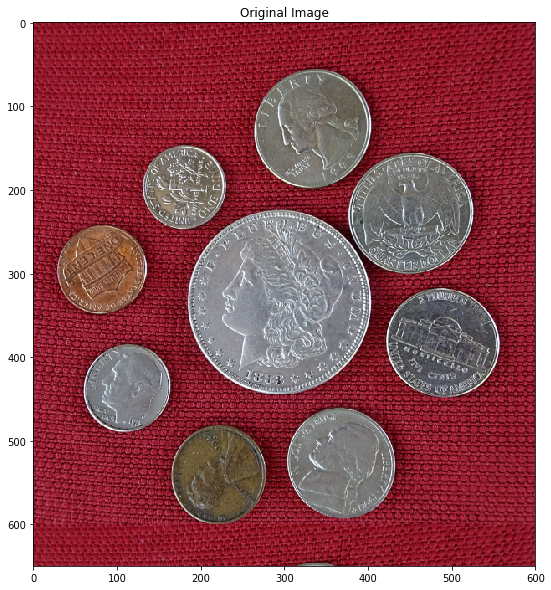

In [5]:
# Image path
imagePath = "images/CoinsA.png"
# Read image
# Store it in the variable image
image = cv2.imread(imagePath)

imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [6]:
# Convert image to grayscale
# Store it in the variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


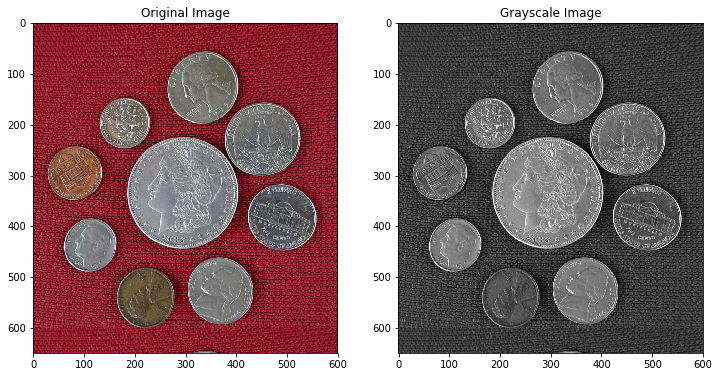

In [7]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [16]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
imageB, imageG, imageR = cv2.split(image)

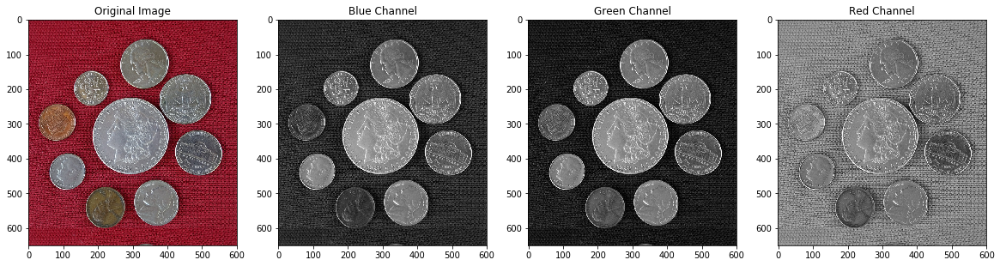

In [17]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

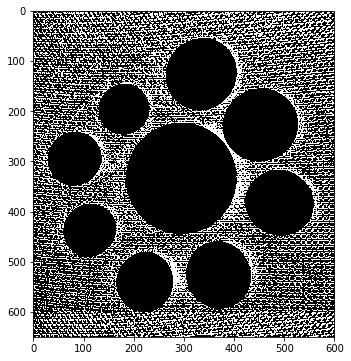

In [227]:
# Set thresold and maximum value
thresh = 20
maxValue = 255
im = imageG.copy()

retval, im_thresh = cv2.threshold(im, thresh, maxValue, cv2.THRESH_BINARY_INV)
matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)
plt.imshow(im_thresh)

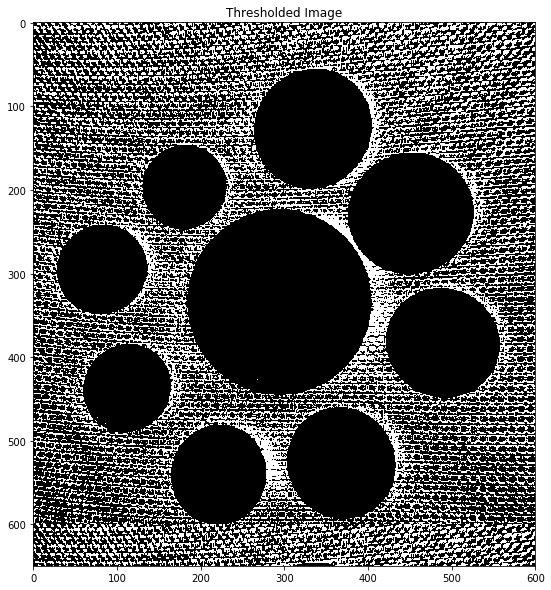

In [148]:
# Display the thresholded image
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

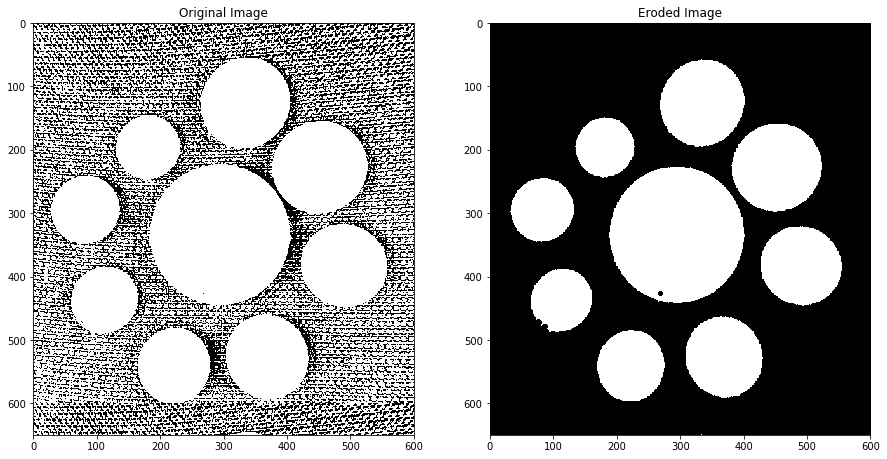

In [228]:
# Inverse image for erosion
im_thresh_inv = cv2.bitwise_not(im_thresh)

# Get structuring element/kernel which will be used for erosion
kSize = (5,5)
erode_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kSize)

# Apply Erosion function on the input image
im_erode = cv2.erode(im_thresh_inv, erode_kernel, iterations=2)

plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(im_thresh_inv);plt.title("Original Image")
plt.subplot(122);plt.imshow(im_erode);plt.title("Eroded Image");

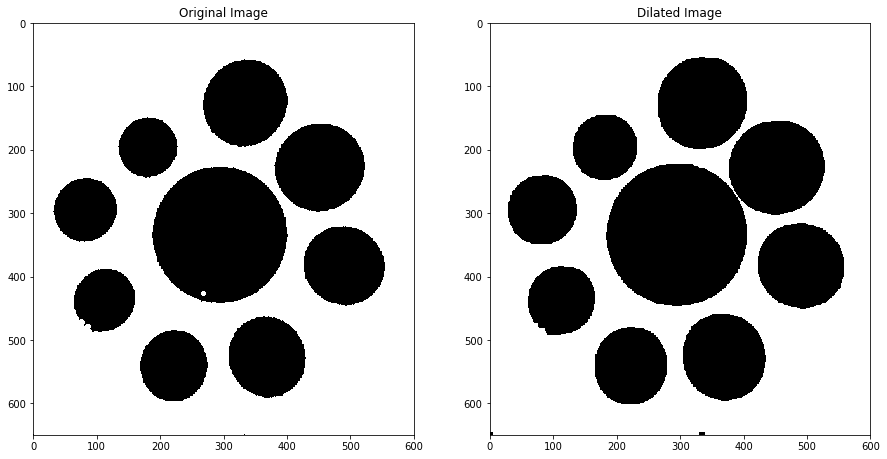

In [229]:
# Invert image for dilation
im_inv = cv2.bitwise_not(im_erode)

# Get structuring element/kernel which will be used for dilation
kSize = (5,5)
dilate_kernel = np.ones(kSize, np.uint8)

# Apply Dilation function on the input image
im_dilate = cv2.erode(im_inv, dilate_kernel, iterations=2)

plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(im_inv);plt.title("Original Image")
plt.subplot(122);plt.imshow(im_dilate);plt.title("Dilated Image");

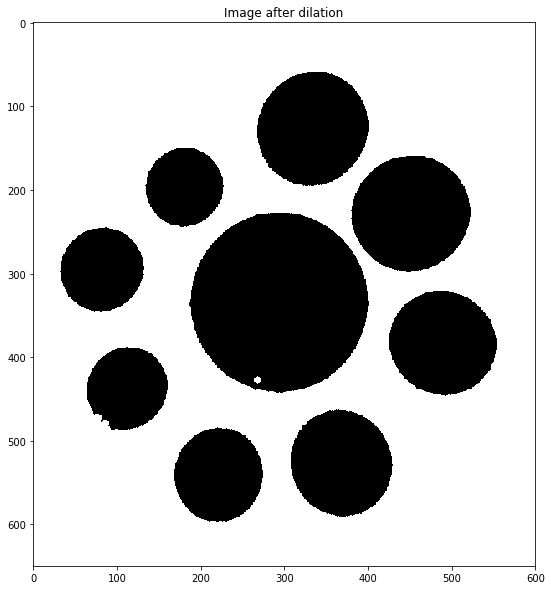

In [151]:
# Display all the images
# you have obtained in the intermediate steps
###
### YOUR CODE HERE
###


In [152]:
# Get structuring element/kernel which will be used for dilation
###
### YOUR CODE HERE
###


In [153]:
###
### YOUR CODE HERE
###


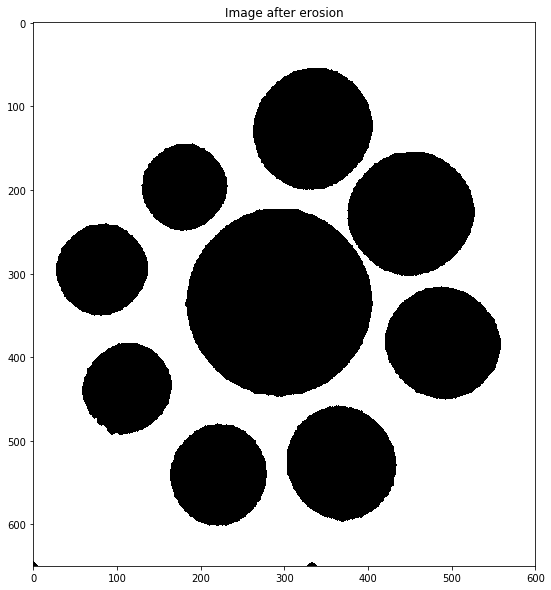

In [154]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [230]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [231]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [232]:
# Detect blobs
keypoints = detector.detect(im_dilate)
print("Number of coins detected = ",len(keypoints))

Number of coins detected =  9


In [158]:
# Print number of coins detected
###
### YOUR CODE HERE
###


Number of coins detected = 9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

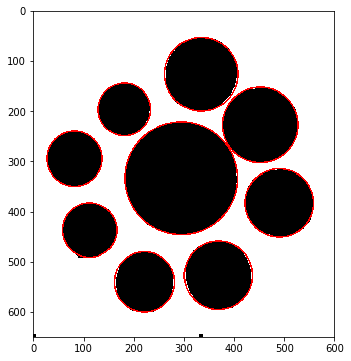

In [233]:
# Mark coins using image annotation concepts we have studied so far
im = cv2.cvtColor(im_dilate, cv2.COLOR_GRAY2BGR)
 
# Mark blobs using image annotation concepts
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(im,(x,y),5,(0,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(im,(x,y),radius,(0,0,255),2)

plt.imshow(im[:,:,::-1])

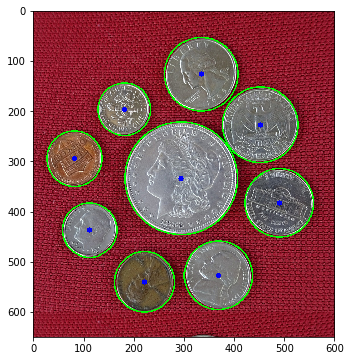

In [238]:
# Mark coins using image annotation concepts we have studied so far
im = image.copy()
 
# Mark blobs using image annotation concepts
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(im,(x,y),5,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(im,(x,y),radius,(0,255,0),2)

plt.imshow(im[:,:,::-1])

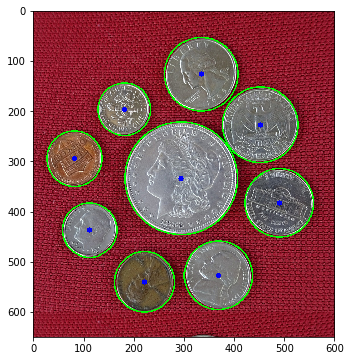

In [239]:
# Display the final image
plt.imshow(im[:,:,::-1])

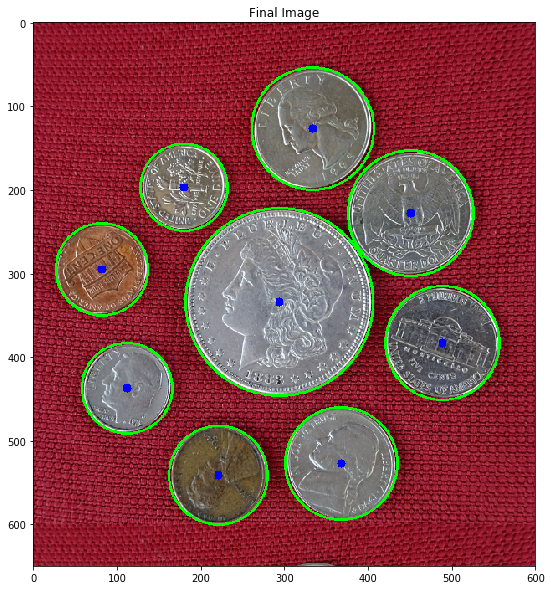

In [160]:
# Display the final image
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [70]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [254]:
# Find connected components


# Threshold Image
th, imThresh = cv2.threshold(im_dilate, 127, 255, cv2.THRESH_BINARY_INV)

# Find connected components
_, imLabels = cv2.connectedComponents(imThresh)

In [255]:
# Print number of connected components detected
print("Number of connected components detected = ",imLabels.max())


Number of connected components detected =  11


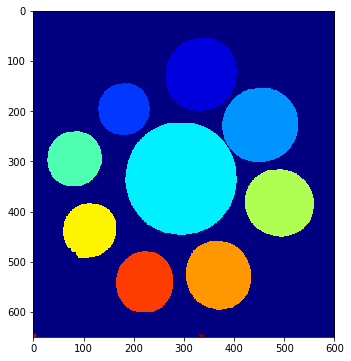

In [256]:
# Display connected components using displayConnectedComponents
# function
displayConnectedComponents(imLabels)


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [293]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(im_dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

In [294]:
# Print the number of contours found
print("Number of contours found = ",len(contours))


Number of contours found =  10


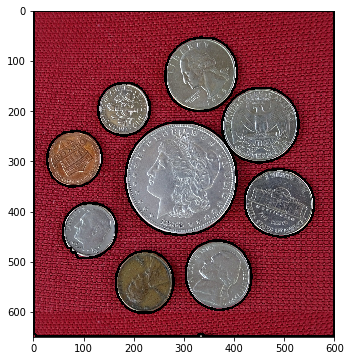

In [295]:
im_contour = image.copy()
# Draw all contours
cv2.drawContours(im_contour, contours, -1, (0,0,0), 3);
plt.imshow(im_contour[:,:,::-1])

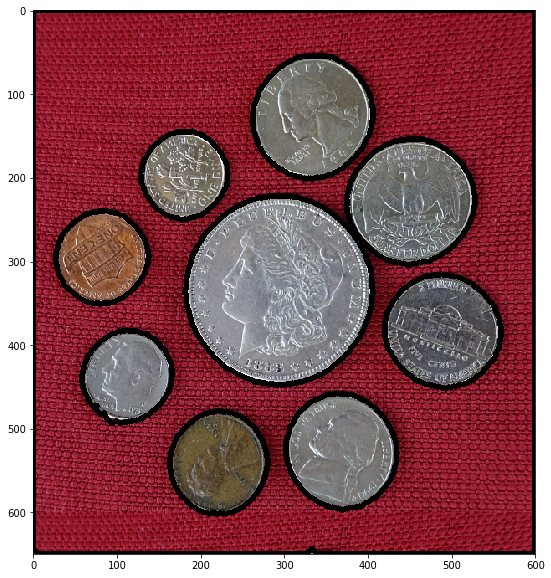

In [167]:
# Draw all contours
###
### YOUR CODE HERE
###


Let's only consider the outer contours.

Number of contours found =  1


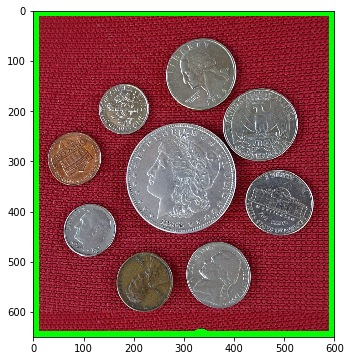

In [292]:
# Remove the inner contours
ext_contours, ext_hierarchy = cv2.findContours(im_dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = ",len(contours))

# Display the result
im_contour = image.copy()
# Draw all contours
cv2.drawContours(im_contour, ext_contours, -1, (0,255,0), 20);
plt.imshow(im_contour[:,:,::-1])

Number of contours found = 1


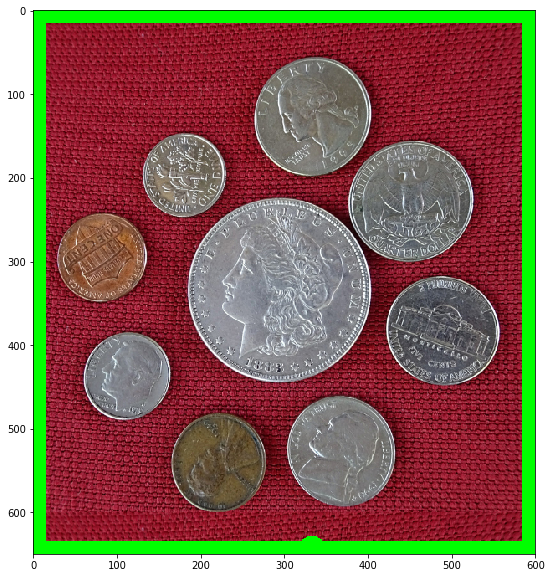

In [168]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [301]:
areas = []
# Print area and perimeter of all contours
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    areas.append(area)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1, area, perimeter))

Contour #1 has area = 11338.0 and perimeter = 406.048770070076
Contour #2 has area = 14389.0 and perimeter = 460.6761864423752
Contour #3 has area = 9250.5 and perimeter = 373.17871284484863
Contour #4 has area = 14737.0 and perimeter = 463.16146779060364
Contour #5 has area = 9628.5 and perimeter = 371.4629831314087
Contour #6 has area = 39542.5 and perimeter = 763.3696182966232
Contour #7 has area = 17906.5 and perimeter = 505.6883782148361
Contour #8 has area = 8508.5 and perimeter = 353.32084798812866
Contour #9 has area = 16615.0 and perimeter = 493.98989486694336
Contour #10 has area = 388677.5 and perimeter = 2504.2426406145096


In [169]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 11118.0 and perimeter = 401.9310212135315
Contour #2 has area = 14133.5 and perimeter = 456.9432144165039
Contour #3 has area = 9075.5 and perimeter = 373.2030990123749
Contour #4 has area = 14482.5 and perimeter = 456.8010768890381
Contour #5 has area = 9404.5 and perimeter = 367.5462449789047
Contour #6 has area = 39121.5 and perimeter = 748.3645672798157
Contour #7 has area = 17612.0 and perimeter = 500.8427075147629
Contour #8 has area = 8298.5 and perimeter = 344.5756813287735
Contour #9 has area = 16370.5 and perimeter = 484.11478412151337
Contour #10 has area = 388697.0 and perimeter = 2497.4558429718018


In [302]:
# Print maximum area of contour
# This will be the box that we want to remove
print("Maximum area of contour = ",max(areas))


Maximum area of contour =  388678.5


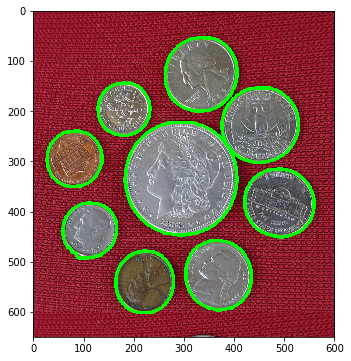

In [307]:
# Remove this contour and plot others
inner_contours = contours[:-1]

im_contour = image.copy()
# Draw all contours
cv2.drawContours(im_contour, inner_contours, -1, (0,255,0), 5);
plt.imshow(im_contour[:,:,::-1])

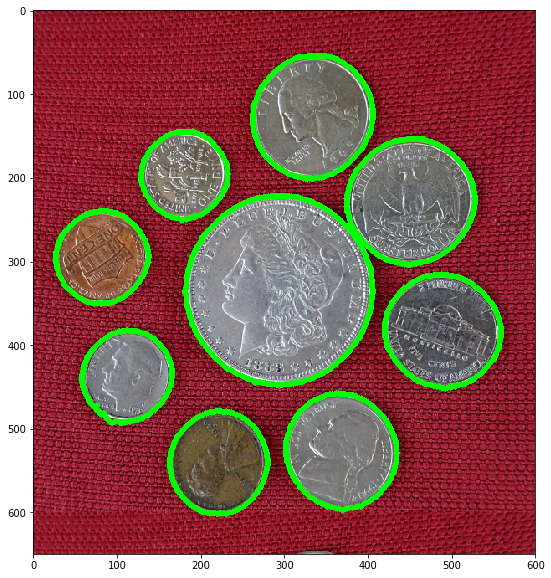

In [171]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Number of coins detected =  9


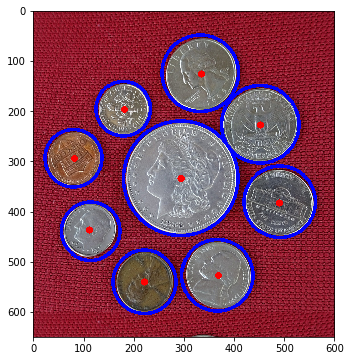

In [319]:
print("Number of coins detected = ",len(inner_contours))

fit_contour = image.copy()
# Fit circles on coins
for cnt in inner_contours:
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    cv2.circle(fit_contour, (x,y), 7, (0,0,255), thickness=-1)
    ((e_x,e_y),radius) = cv2.minEnclosingCircle(cnt)
    cv2.circle(image, (int(e_x),int(e_y)), int(round(radius)), (255,0,0), 15)

    
plt.imshow(fit_contour[...,::-1])    

Number of coins detected = 9


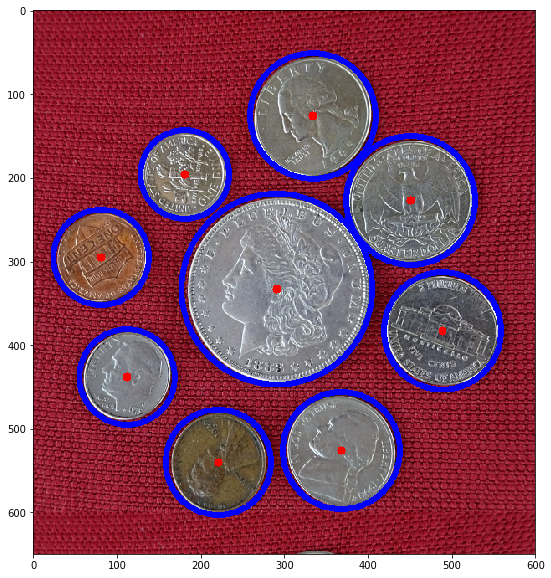

In [173]:
# Fit circles on coins
###
### YOUR CODE HERE
###


# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5, 1.0, 'Original Image')

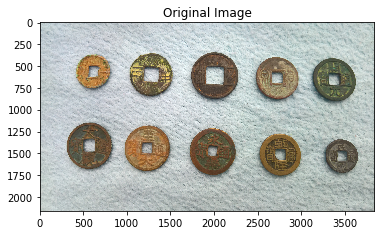

In [2]:
# Image path
imagePath = "images/CoinsB.png"
# Read image
# Store it in variable image
image = cv2.imread(imagePath)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [3]:
# Convert to grayscale
# Store in variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


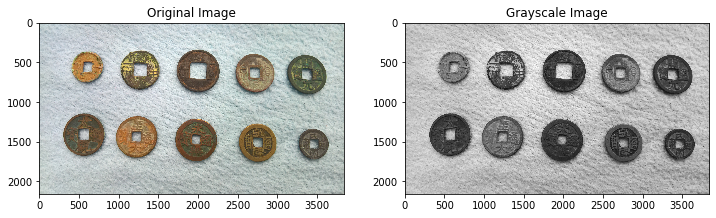

In [7]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [8]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
imageB, imageG, imageR = cv2.split(image)


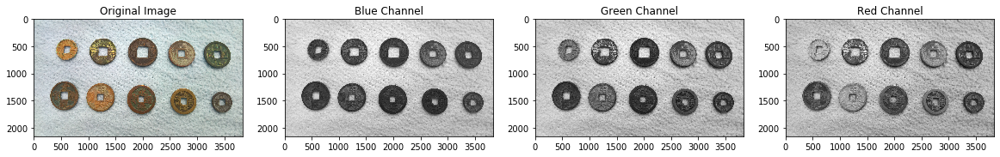

In [9]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

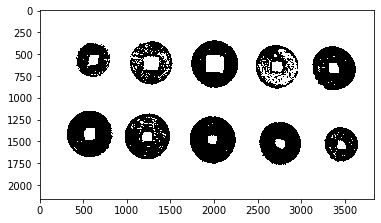

In [13]:
# Set thresold and maximum value
thresh = 100
maxValue = 255
im = imageB.copy()

retval, im_thresh = cv2.threshold(im, thresh, maxValue, cv2.THRESH_BINARY)
matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

# Display image using matplotlib
plt.imshow(im_thresh)

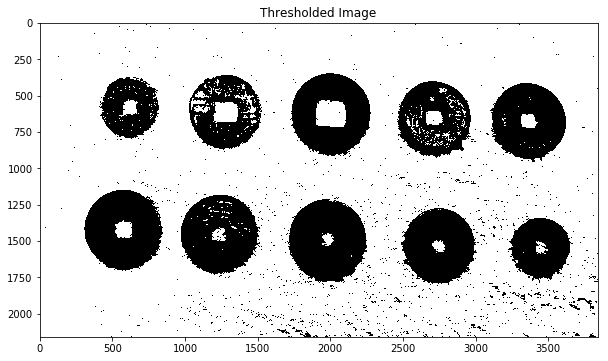

In [36]:
# Display image using matplotlib
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

Text(0.5, 1.0, 'After Opening Operation')

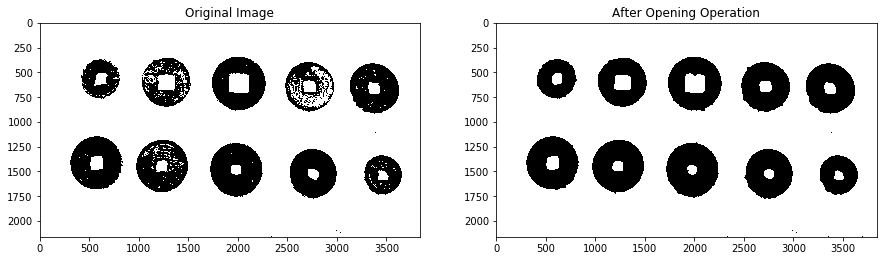

In [16]:
# Get structuring element/kernel which will be used 
# for opening operation
openingSize = 5

# Selecting a elliptical kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, 
            (2 * openingSize + 1, 2 * openingSize + 1),
            (openingSize,openingSize))

imageMorphOpened = cv2.morphologyEx(im_thresh, cv2.MORPH_OPEN, 
                        element,iterations=5)
plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(im_thresh);plt.title("Original Image")
plt.subplot(122);plt.imshow(imageMorphOpened);plt.title("After Opening Operation")

In [38]:
###
### YOUR CODE HERE
###


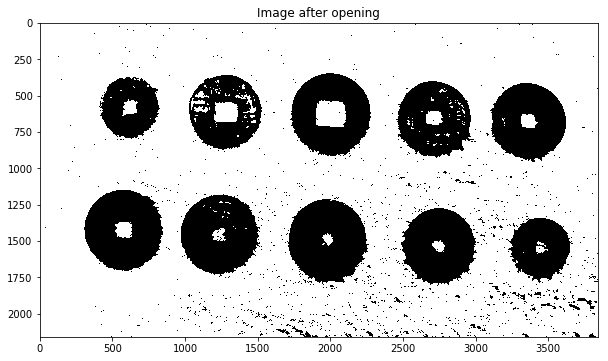

In [39]:
###
### YOUR CODE HERE
###


Text(0.5, 1.0, 'After Closing Operation')

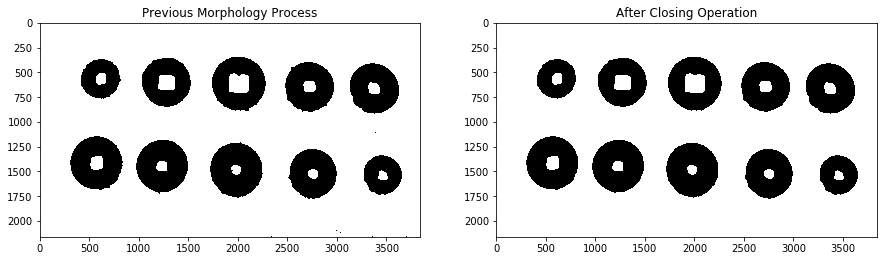

In [45]:
# Get structuring element/kernel which will be used 
# for closing operation
closingSize = 5

# Selecting a elliptical kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, 
            (2 * closingSize + 1, 2 * closingSize + 1),
            (closingSize, closingSize))

imageMorphClosed = cv2.morphologyEx(imageMorphOpened, cv2.MORPH_CLOSE, 
                        element,iterations=7)
plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(imageMorphOpened);plt.title("Previous Morphology Process")
plt.subplot(122);plt.imshow(imageMorphClosed);plt.title("After Closing Operation")

In [41]:
###
### YOUR CODE HERE
###


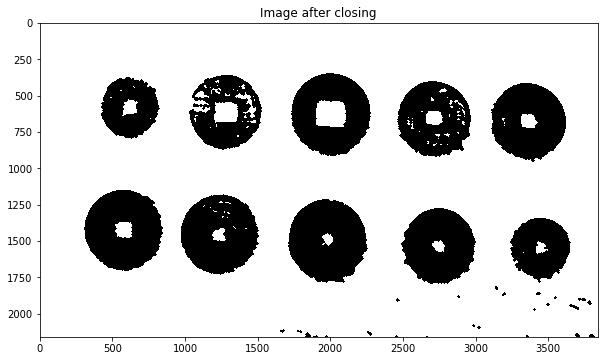

In [42]:
###
### YOUR CODE HERE
###


Text(0.5, 1.0, 'After Second Opening Operation')

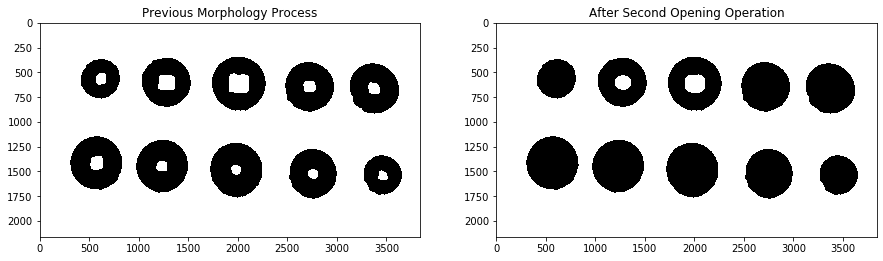

In [46]:
# Get structuring element/kernel which will be used 
# for second opening operation
openingSize = 10

# Selecting a elliptical kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, 
            (2 * openingSize + 1, 2 * openingSize + 1),
            (openingSize,openingSize))

imageMorphOpened2 = cv2.morphologyEx(imageMorphClosed, cv2.MORPH_OPEN, 
                        element,iterations=7)

plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(imageMorphClosed);plt.title("Previous Morphology Process")
plt.subplot(122);plt.imshow(imageMorphOpened2);plt.title("After Second Opening Operation")

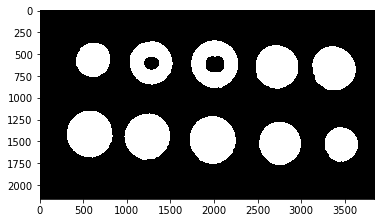

In [47]:
inv_image = cv2.bitwise_not(imageMorphOpened2)
plt.imshow(inv_image)

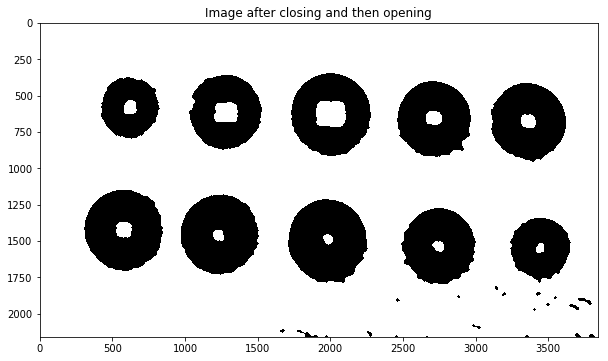

In [45]:
###
### YOUR CODE HERE
###


In [46]:
###
### YOUR CODE HERE
###


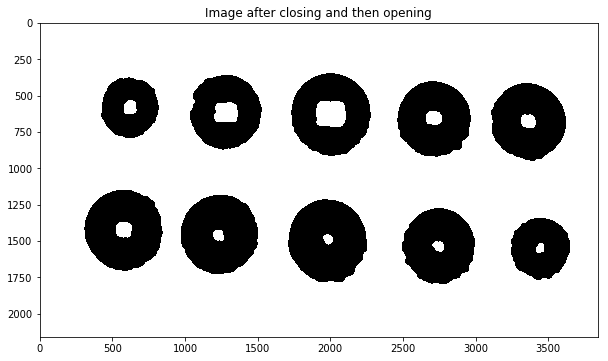

In [47]:
###
### YOUR CODE HERE
###


In [48]:
###
### YOUR CODE HERE
###


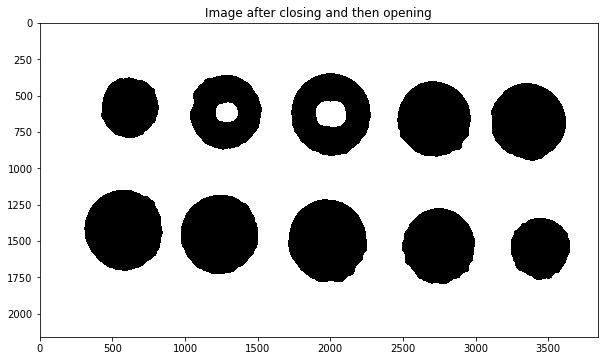

In [49]:
###
### YOUR CODE HERE
###


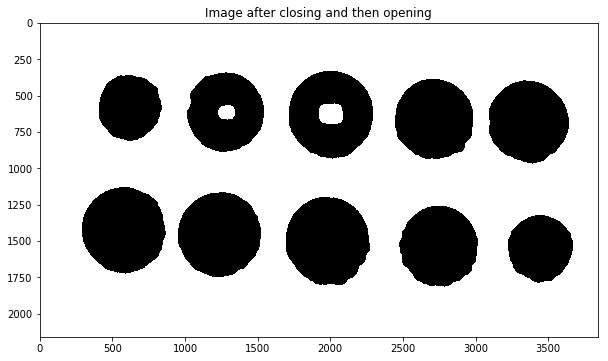

In [50]:
###
### YOUR CODE HERE
###


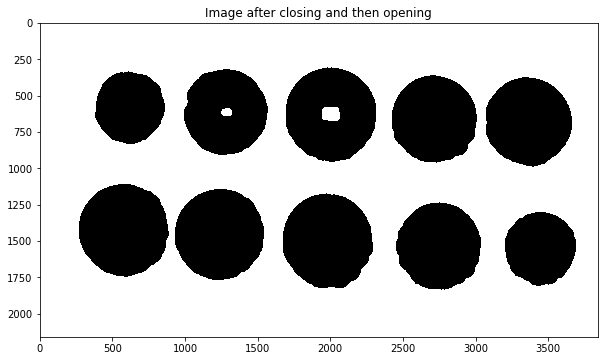

In [51]:
###
### YOUR CODE HERE
###


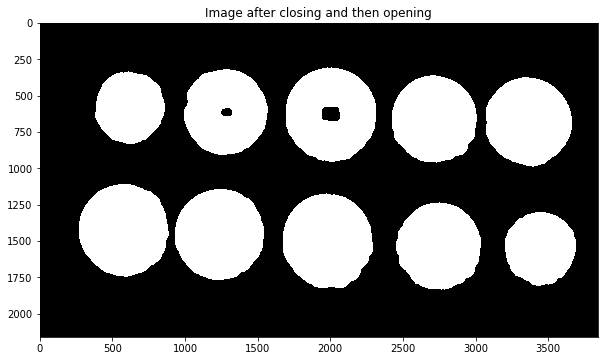

In [52]:
###
### YOUR CODE HERE
###


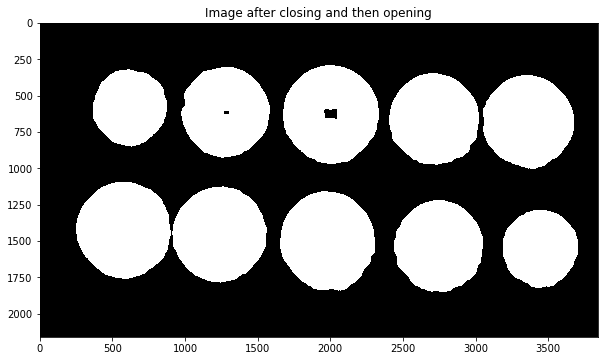

In [53]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [66]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [67]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [68]:
# Detect blobs
keypoints = detector.detect(imageMorphOpened2)


print("Number of coins detected = ",len(keypoints))
keypoints

Number of coins detected =  8


[<KeyPoint 00000198DB7C8D80>,
 <KeyPoint 00000198DB7C8420>,
 <KeyPoint 00000198DB7DE180>,
 <KeyPoint 00000198DB65DCC0>,
 <KeyPoint 00000198DB799C00>,
 <KeyPoint 00000198DB7993F0>,
 <KeyPoint 00000198DB799DB0>,
 <KeyPoint 00000198DB799990>]

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

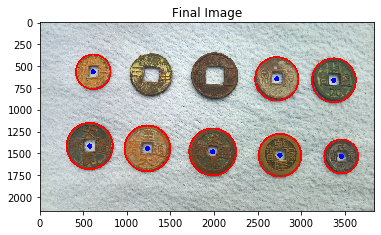

In [69]:
# Mark coins using image annotation concepts we have studied so far
im = image.copy()
 
# Mark blobs using image annotation concepts
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(im,(x,y),30,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(im,(x,y),radius,(0, 0, 255), 20)

plt.imshow(im[:,:,::-1])
plt.title("Final Image")
plt.show()

In [58]:
###
### YOUR CODE HERE
###


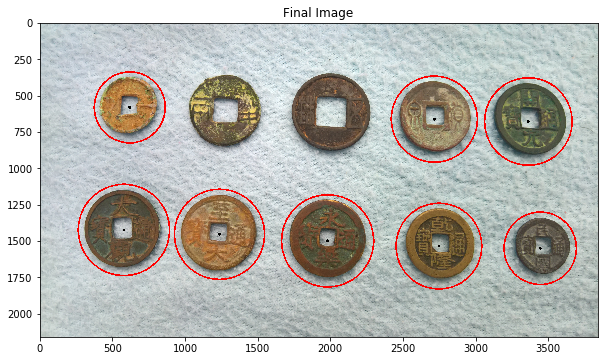

In [59]:
###
### YOUR CODE HERE
###


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [72]:
# Find connected components
# Threshold Image
th, imThresh = cv2.threshold(imageMorphOpened2, 127, 255, cv2.THRESH_BINARY_INV)

# Find connected components
_, imLabels = cv2.connectedComponents(imThresh)

In [73]:
print("Number of connected components detected = ", imLabels.max())

Number of connected components detected =  10


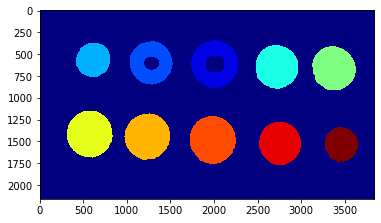

In [75]:
displayConnectedComponents(imLabels)

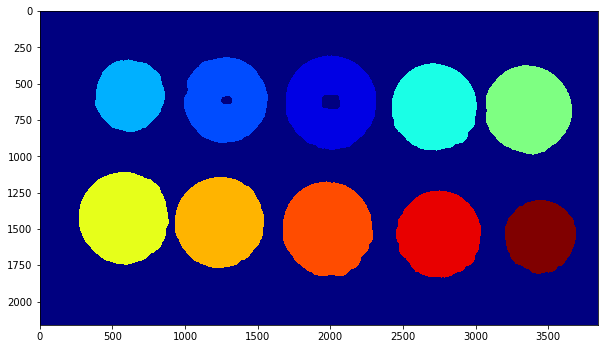

In [62]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [78]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(imageMorphOpened2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)


13

In [79]:
# Print the number of contours found
print("Number of contours found = ",len(contours))


Number of contours found =  13


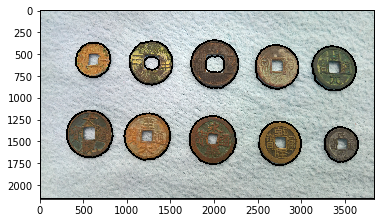

In [82]:
im_contour = image.copy()
# Draw all contours
cv2.drawContours(im_contour, contours, -1, (0,0,0), 20);
plt.imshow(im_contour[:,:,::-1])

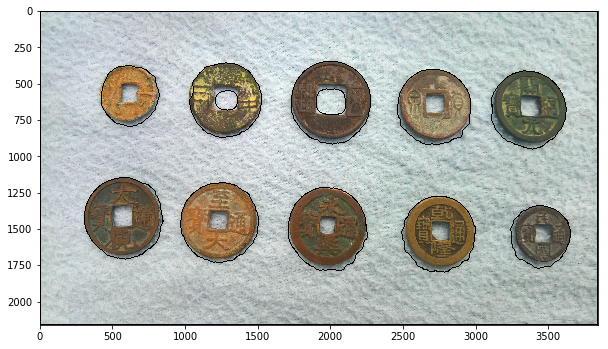

In [65]:
# Draw all contours
###
### YOUR CODE HERE
###


Number of contours found =  13


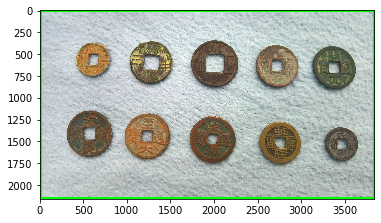

In [85]:
# Remove the inner contours
ext_contours, ext_hierarchy = cv2.findContours(imageMorphOpened2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = ",len(contours))

# Display the result
im_contour = image.copy()
# Draw all contours
cv2.drawContours(im_contour, ext_contours, -1, (0,255,0), 50);
plt.imshow(im_contour[:,:,::-1])

Number of contours found = 1


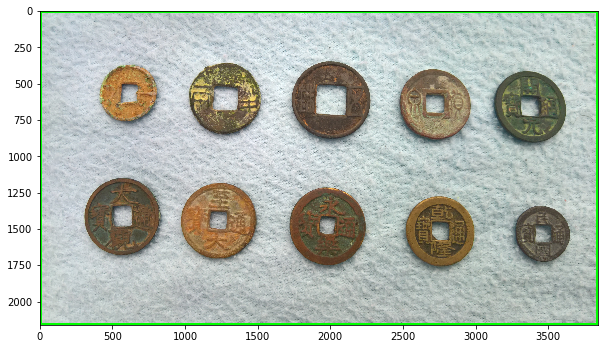

In [66]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [86]:
areas = []
# Print area and perimeter of all contours
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    areas.append(area)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1, area, perimeter))

Contour #1 has area = 118575.0 and perimeter = 1302.8224985599518
Contour #2 has area = 186910.5 and perimeter = 1621.4570615291595
Contour #3 has area = 226317.0 and perimeter = 1792.5525151491165
Contour #4 has area = 216230.5 and perimeter = 1751.9667183160782
Contour #5 has area = 221314.0 and perimeter = 1778.5525144338608
Contour #6 has area = 19855.0 and perimeter = 527.7300102710724
Contour #7 has area = 33170.0 and perimeter = 690.8427081108093
Contour #8 has area = 197174.5 and perimeter = 1677.7413296699524
Contour #9 has area = 192976.5 and perimeter = 1655.65806889534
Contour #10 has area = 122748.0 and perimeter = 1329.1067717075348
Contour #11 has area = 191421.0 and perimeter = 1643.6996994018555
Contour #12 has area = 231118.0 and perimeter = 1811.1799325942993
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [67]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 135398.0 and perimeter = 1401.449918627739
Contour #2 has area = 203535.5 and perimeter = 1720.5697610378265
Contour #3 has area = 242100.5 and perimeter = 1871.0794281959534
Contour #4 has area = 229459.0 and perimeter = 1813.3809397220612
Contour #5 has area = 235121.5 and perimeter = 1837.1382957696915
Contour #6 has area = 16605.5 and perimeter = 485.2031031847
Contour #7 has area = 30872.0 and perimeter = 666.9015874862671
Contour #8 has area = 213446.5 and perimeter = 1743.339308977127
Contour #9 has area = 207230.0 and perimeter = 1723.2144236564636
Contour #10 has area = 130007.0 and perimeter = 1371.1067732572556
Contour #11 has area = 197785.0 and perimeter = 1696.1261086463928
Contour #12 has area = 243313.0 and perimeter = 1854.836783528328
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [87]:
# Print maximum area of contour
# This will be the box that we want to remove
print("Maximum area of contour = ", max(areas))


Maximum area of contour =  8288401.0


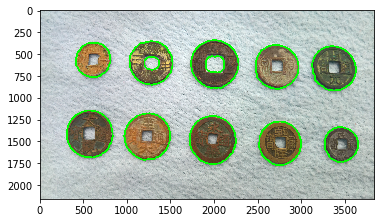

In [90]:
# Remove this contour and plot others
# Remove this contour and plot others
inner_contours = contours[:-1]

im_contour = image.copy()
# Draw all contours
cv2.drawContours(im_contour, inner_contours, -1, (0,255,0), 20);
plt.imshow(im_contour[:,:,::-1])

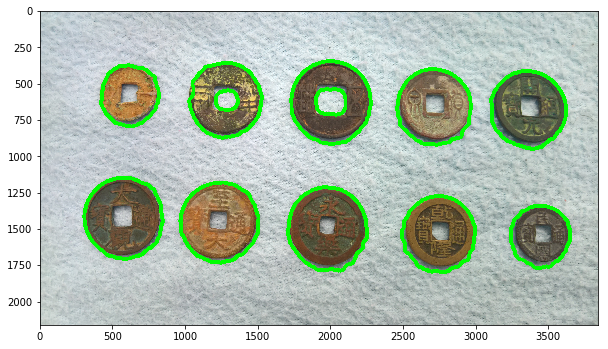

In [69]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [114]:
# Print sorted area of contours
sorted_inner_area_cnt = {}
for idx, cnt in enumerate(inner_contours):
    area = cv2.contourArea(cnt)
#     print("Inner Contour #{} has area = {}".format(idx, area))
    sorted_inner_area_cnt[area] = cnt

sorted_inner_area_cnt = sorted(sorted_inner_area_cnt)
for i in sorted_inner_area_cnt.keys:
    print(i)

AttributeError: 'list' object has no attribute 'keys'

In [110]:
sorted(sorted_inner_area_cnt)[2:]

[118575.0,
 122748.0,
 186910.5,
 191421.0,
 192976.5,
 197174.5,
 216230.5,
 221314.0,
 226317.0,
 231118.0]

In [70]:
# Print sorted area of contours
###
### YOUR CODE HERE
###


16605.5
30872.0
130007.0
135398.0
197785.0
203535.5
207230.0
213446.5
229459.0
235121.5
242100.5
243313.0
8288401.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

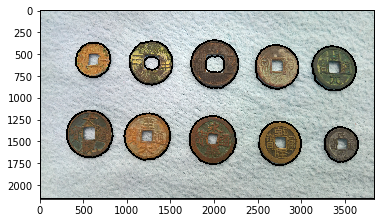

In [100]:
# Remove the 2 inner contours
# Plot the rest of them

im_contour = image.copy()

for cnt in inner_contours:
    area = cv2.contourArea(cnt)
    if (area != 16605.5) and (area != 30872.0):
        cv2.drawContours(im_contour, contours, -1, (0,0,0), 20);

plt.imshow(im_contour[:,:,::-1])


Number of contours = 10


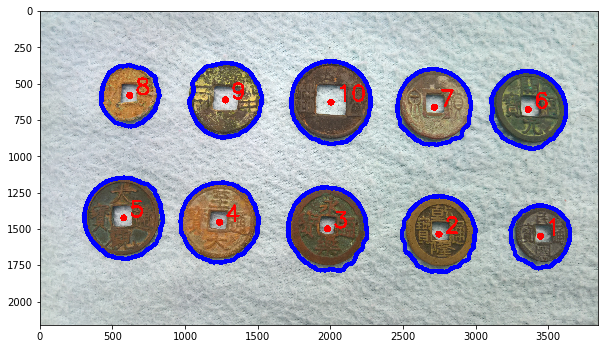

In [71]:
# Remove the 2 inner contours
# Plot the rest of them
###
### YOUR CODE HERE
###


Number of coins detected = 10


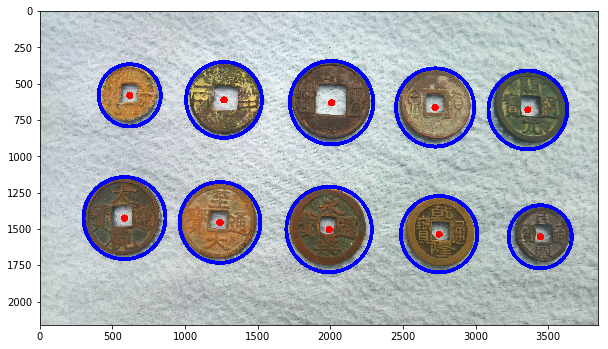

In [72]:
# Fit circles on coins
###
### YOUR CODE HERE
###
